# PFI - CellRank analysis

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse
import anndata
import scvelo as scv

In [3]:
import pickle

In [4]:
import cellrank as cr

In [5]:
## import utils
cwd = '../utils/'
sys.path.append(cwd)

import genes
import panfetal_utils
import ti_utils

In [6]:
figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/cellrank_analysis/"
if os.path.exists(figdir):
    sc.settings.figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/cellrank_analysis/"
else:
    os.mkdir(figdir)
    sc.settings.figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/cellrank_analysis/"
    

## Load data + annotations

Lymphoid data 4 now 

In [7]:
def _load_split_and_annotation(split, PFI_prefix = "PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118", data_dir = '/nfs/team205/ed6/data/Fetal_immune/'):
    '''
    Load anndata of Pan Fetal Immune split + annotation for the same split
    '''
    split_file = "{prefix}.{split}.batchCorrected.h5ad".format(prefix = PFI_prefix, split = split)
    adata = sc.read_h5ad(data_dir + split_file)
    adata_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.full_obs.annotated.csv", index_col=0)

    ### Load manual annotations
    anno_dir = '../manual_annotation/'
    keep_anno = [split]

    adata_obs["anno_lvl_1"] = np.nan
    adata_obs["anno_lvl_2"] = np.nan

    for anno in keep_anno:
        anno_file = "{prefix}.{anno}.batchCorrected_annotation.csv".format(prefix = PFI_prefix, anno = anno)
        if anno_file in os.listdir(anno_dir):
            anno_df = pd.read_csv(anno_dir + anno_file, index_col=0)
        else:
            print("No .csv found for annotation" + anno)
        ## Check for collisions between annotations (they should have been manually fixed)
        if adata_obs.loc[anno_df.index,'anno_lvl_1'].isna().all():        
            adata_obs.loc[anno_df.index,"anno_lvl_1"] = anno_df["anno_lvl_1"]
            adata_obs.loc[anno_df.index,"anno_lvl_2"] = anno_df["anno_lvl_2"]
        else:
            n_cells=anno_df.index.shape[0] - adata_obs.loc[anno_df.index,'anno_lvl_1'].isna().sum()
            print("Error! {n} cells are already annotated".format(n=n_cells))

    adata.obs = pd.concat([adata.obs, adata_obs.loc[adata.obs_names][["anno_lvl_1", "anno_lvl_2"]]], 1)
    return(adata)

In [8]:
data_dir = '/nfs/team205/ed6/data/Fetal_immune/'
PFI_prefix = "PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118"

In [8]:
adata_lymph = _load_split_and_annotation("LYMPHOID")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... storing 'anno_lvl_1' as categorical
... storing 'anno_lvl_2' as categorical


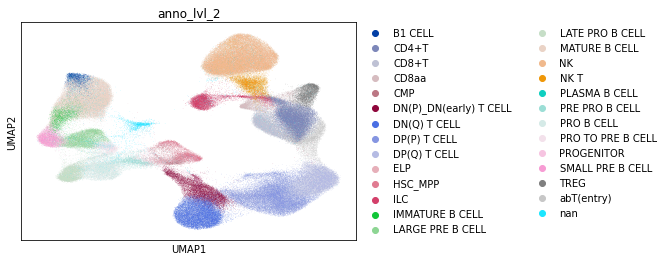

In [9]:
sc.pl.umap(adata_lymph, color="anno_lvl_2")

In [10]:
## Remove cells missing annotation
adata_lymph = adata_lymph[adata_lymph.obs["anno_lvl_2"] !='nan']

In [11]:
## Recalculate BBKNN graph without trimming (maintains symmetry)
from bbknn import bbknn
adata_lymph.obs['bbk'] = [x+y+z for x,y,z in zip(adata_lymph.obs['donor'],adata_lymph.obs['method'],adata_lymph.obs['organ'])]
bbknn(adata_lymph, batch_key = 'bbk', n_pcs=30, approx=True, trim=0)

Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [12]:
adata_lymph

AnnData object with n_obs × n_vars = 239119 × 3436
    obs: 'Sample', 'n_counts', 'n_genes', 'donor', 'organ', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'batch', 'bbk', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'Sample.lanes', 'Sort_id', 'age', 'method', 'sex', 'Processing_method', 'AnnatomicalPart', 'leiden_100', 'leiden_150', 'uniform_label_propagated', 'uniform_label_lvl0_propagated', 'uniform_label_expanded_merged_propagated', 'leiden_150_pred_label', 'leiden_150_pred_label_expanded', 'split_1', 'split_2', 'split_3', 'anno_lvl_1', 'anno_lvl_2'
    var: 'GeneName', 'GeneID', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'neighbors', 'pca', 'umap', 'anno_lvl_2_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

### Save different versions of Age kernel

Changing the k parameter (higher k = less cells are conserved as neighbors even if they go against age)

In [14]:
outdir = "/nfs/team205/ed6/data/Fetal_immune/cellrank_outputs/"
adata_lymph.obs["age"] = adata_lymph.obs["age"].astype('int64')
age_k_3 = cr.tl.kernels.PalantirKernel(adata_lymph, time_key="age").compute_transition_matrix(k=3)

In [24]:
pickle.dump(age_k_3, open(outdir+"LYMPHOID_PalantirKernel.k3.p", "wb" ))

In [25]:
age_k_5 = cr.tl.kernels.PalantirKernel(adata_lymph, time_key="age").compute_transition_matrix(k=5)
pickle.dump(age_k_5, open(outdir+"LYMPHOID_PalantirKernel.k5.p", "wb" ))
age_k_10 = cr.tl.kernels.PalantirKernel(adata_lymph, time_key="age").compute_transition_matrix(k=10)
pickle.dump(age_k_10, open(outdir+"LYMPHOID_PalantirKernel.k10.p", "wb" ))

In [ ]:
# ## Run cellrank
# ti_utils.run_cellrank(adata_lymph,  weights={'c':0.5, "a":0.5}, compute_macrostates=True)

# out_file = "{prefix}.{split}.batchCorrected.CR_results.h5ad".format(prefix = PFI_prefix, split = "LYMPHOID")
# adata_lymph.write_h5ad(out_file)

### Do I need to regress out organ?
Testing the integration pipeline w/o including the organ covariate in the ridge-regression step

In [9]:
adata_b = sc.read_h5ad('/home/jovyan/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.B_CLEAN_CLEAN.batchCorrected.no_organ.h5ad')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [10]:
adata_b.obs = pd.concat([adata_b.obs, adata_obs.loc[adata_b.obs_names][["anno_lvl_1", "anno_lvl_2"]]], 1)

... storing 'anno_lvl_1' as categorical
... storing 'anno_lvl_2' as categorical


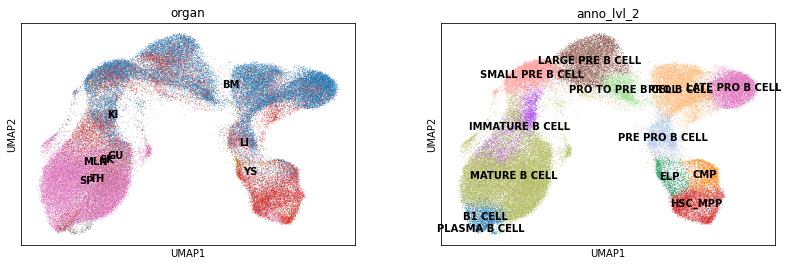

In [11]:
sc.pl.umap(adata_b, color=["organ", 'anno_lvl_2'], legend_loc="on data")

### NK TI analysis

In [9]:
adata_nkt = _load_split_and_annotation("NKT_CLEAN")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


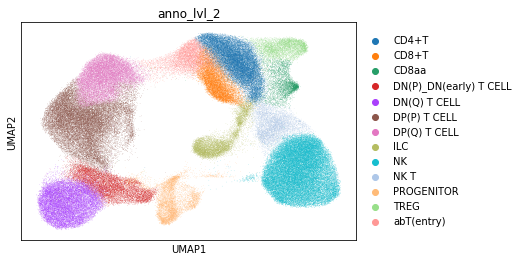

In [12]:
sc.pl.umap(adata_nkt, color="anno_lvl_2")

In [13]:
adata_nk = adata_nkt[adata_nkt.obs.anno_lvl_2=="NK"]

In [24]:
data_dir + PFI_prefix + ".NKT_CLEAN.h5ad"

'/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.NKT_CLEAN.h5ad'

In [21]:
[x for x in os.listdir(data_dir) if PFI_prefix+".NKT_CLEAN" in x]

['PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.NKT_CLEAN.h5ad',
 'PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.NKT_CLEAN.batchCorrected.h5ad',
 'PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.NKT_CLEAN.batchCorrected.1.h5ad']

In [30]:
adata_nkt_raw = sc.read_h5ad('/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.LYMPHOID.h5ad')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [32]:
adata_nkt_raw = adata_nkt_raw[adata_nk.obs_names]

In [35]:
dir(panfetal_utils)

['IG_genes',
 'Ridge',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_load_split_and_annotation',
 '_propagate_labels',
 'bbknn',
 'cc_genes',
 'is_cycling',
 'np',
 'os',
 'pd',
 'pfi_clustering',
 'pfi_preprocess',
 'remove_geneset',
 'ridge_regression',
 'sc',
 'scipy',
 'sys',
 'time']

In [36]:
panfetal_utils.pfi_preprocess(adata_nkt_raw, how="", remove_geneset=[genes.cc_genes, genes.IG_genes, genes.TCR_genes])

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


TypeError: 'list' object is not callable

In [43]:
remove_geneset=[genes.cc_genes, genes.IG_genes, genes.TCR_genes]

# remove_geneset(adata_nkt_raw,  genes.IG_genes)
from genes import cc_genes

## Test cellrank on B cells

In [8]:
adata_b = _load_split_and_annotation("B_CLEAN_CLEAN")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


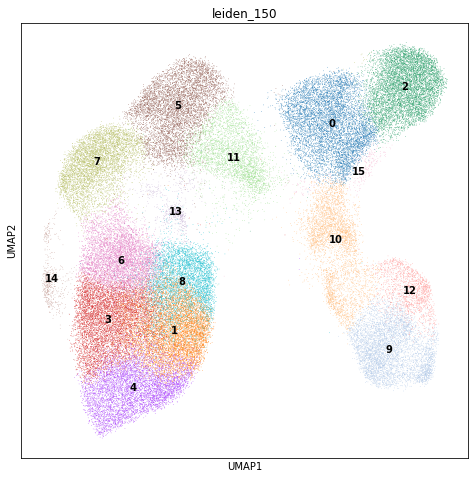

IndexError: index 143653 is out of bounds for axis 0 with size 72035

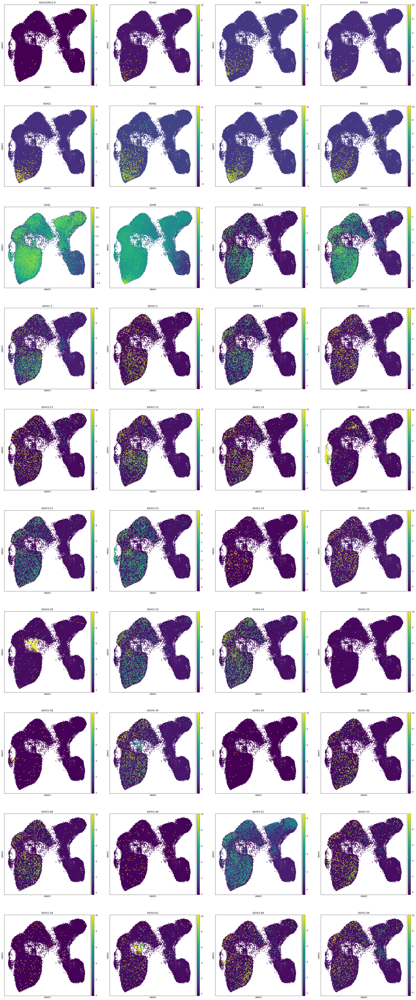

In [20]:
plt.rcParams["figure.figsize"] = [8,8]
sc.pl.umap(adata_b, color="leiden_150", legend_loc="on data")
sc.pl.umap(adata_b, color=ig_genes, legend_loc="on data", size=40)

### Connectivity Kernel

i.e. no directionality information, just transcriptional similarity

In [8]:
ck = cr.tl.kernels.ConnectivityKernel(adata_b).compute_transition_matrix()

### Estimators

In [9]:
g = cr.tl.estimators.GPCCA(ck)
print(g)

GPCCA[n=72035, kernel=<ConnectivityKernel[dnorm=True, key=connectivities]>]


In [26]:
## Convert to category to use to name macrostates
adata_b.obs["anno_lvl_2"] = adata_b.obs["anno_lvl_2"].astype("category")

## Use the number of annotated clusters as number of macrostates/schur vectors
n_states = adata_b.obs["anno_lvl_2"].unique().shape[0]

In [27]:
g.compute_schur(n_components=n_states, method="krylov")
# g.plot_spectrum()

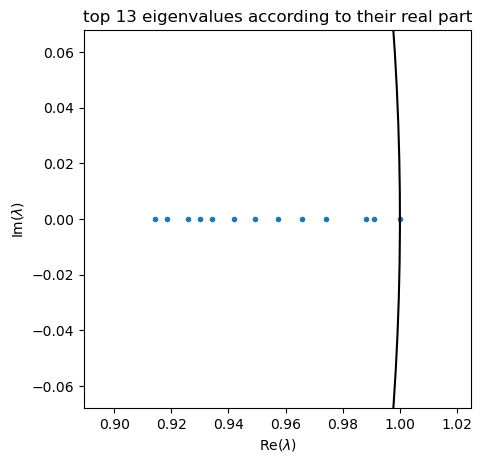

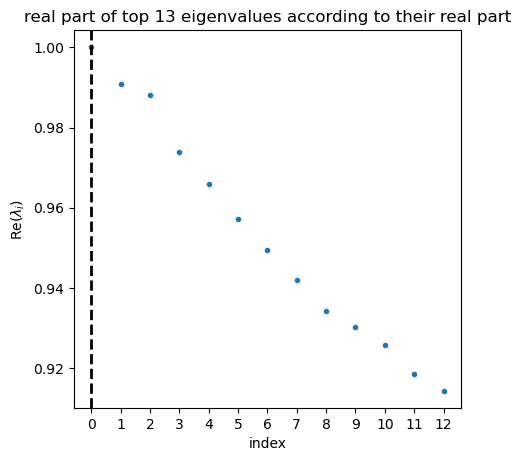

In [28]:
g.plot_spectrum()
g.plot_spectrum(real_only=True)

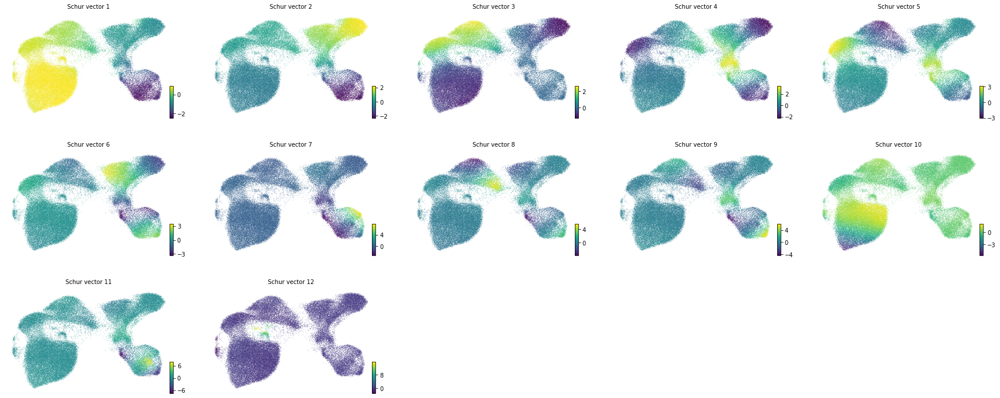

In [30]:
g.plot_schur(ncols=5)

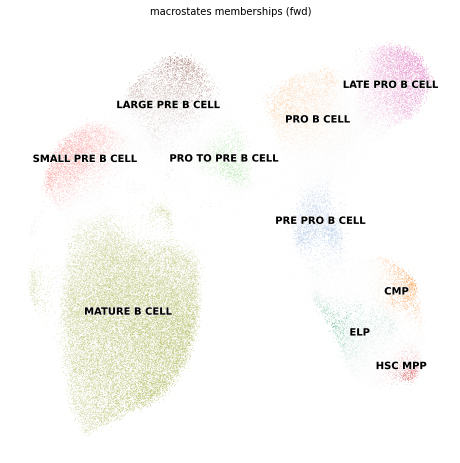

In [31]:
g.compute_macrostates(n_states=10, cluster_key="anno_lvl_2", n_cells=30)
plt.rcParams["figure.figsize"] = [8,8]
g.plot_macrostates()

/nfs/team205/ed6/bin/cellrank/cellrank/tl/estimators/_gpcca.py:572: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks_labels)


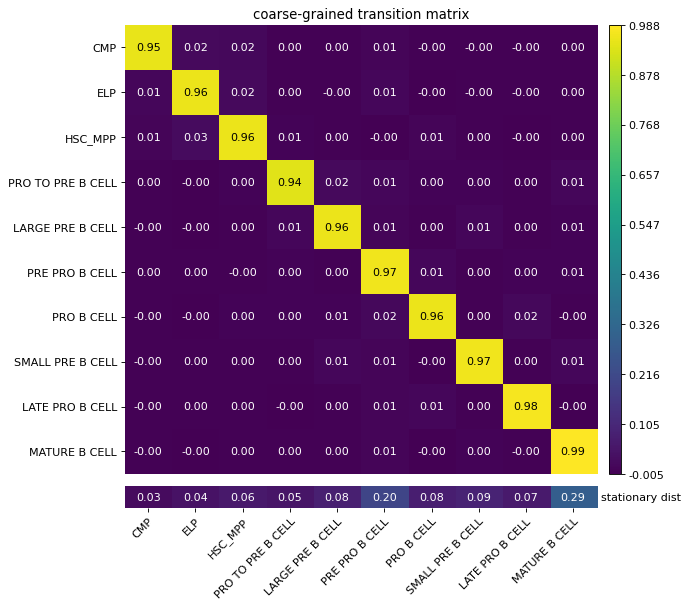

In [32]:
g.plot_coarse_T(text_kwargs={"fontsize": 10})

In [19]:
g.set_terminal_states_from_macrostates()

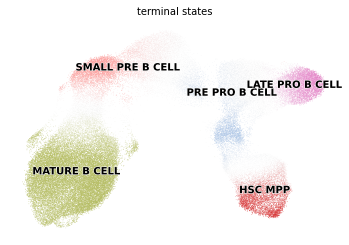

In [21]:
cr.pl.terminal_states(adata_b)

In [10]:
split="B_CLEAN_CLEAN"

In [ ]:
adata_b.write_h5ad("{prefix}.{split}.batchCorrected.no_organ.cellrank.CK.h5ad".format(prefix = PFI_prefix, split = split))

In [8]:
split="B_CLEAN_CLEAN"
adata_b = sc.read_h5ad("{prefix}.{split}.batchCorrected.no_organ.cellrank.CK.h5ad".format(prefix = PFI_prefix, split = split))

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [9]:
# k = cr.tl.transition_matrix(
#     adata_b, weight_connectivities=0.2, softmax_scale=4, show_progress_bar=False
# )
ck = cr.tl.kernels.ConnectivityKernel(adata_b).compute_transition_matrix()
g = cr.tl.estimators.GPCCA(ck)

In [10]:
g.compute_schur(n_components=4)
# g.compute_macrostates(cluster_key="anno_lvl_2")

Define terminal states a priori

In [11]:
g.set_terminal_states({"MATURE B CELL": adata_b[adata_b.obs["anno_lvl_2"] == "MATURE B CELL"].obs_names, 
                      "B1 CELL": adata_b[adata_b.obs["anno_lvl_2"] == "B1 CELL"].obs_names,
                      "PLASMA B CELL": adata_b[adata_b.obs["anno_lvl_2"] == "PLASMA B CELL"].obs_names})

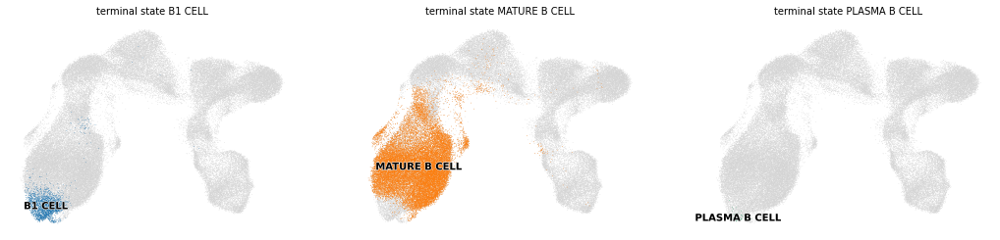

In [13]:
g.plot_terminal_states(same_plot=False)

In [15]:
g.compute_absorption_probabilities(n_jobs=10, use_petsc=True)

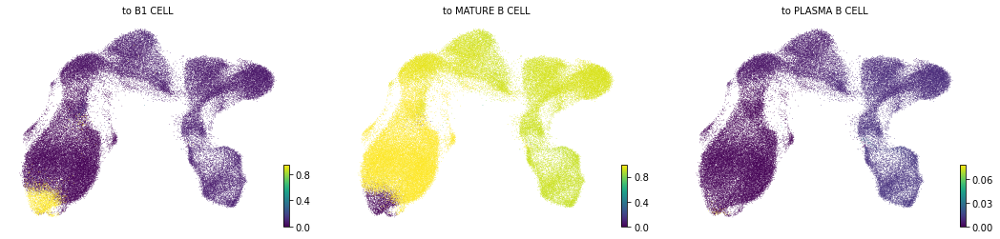

In [32]:
g.plot_absorption_probabilities(same_plot=False)

In [36]:
for l in g.absorption_probabilities.names:
    obs_name = l + " probability"
    adata_b.obs[obs_name] = g.absorption_probabilities[l]

ERROR! Session/line number was not unique in database. History logging moved to new session 124


... storing 'terminal_states_probs' as categorical


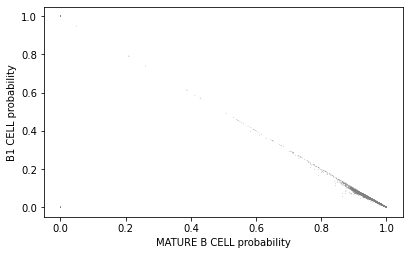

In [39]:
sc.pl.scatter(adata_b, "MATURE B CELL probability", "B1 CELL probability")


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


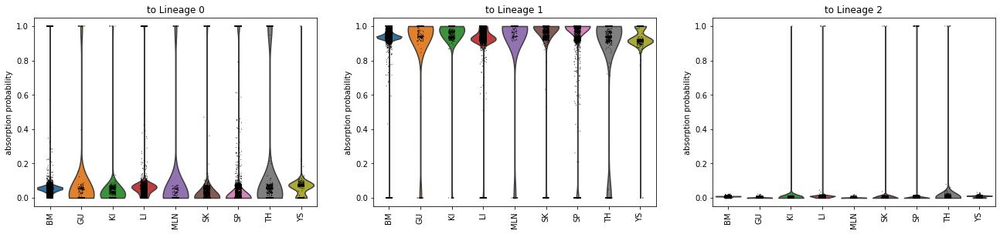

In [41]:
cr.pl.cluster_fates(adata_b, cluster_key='organ', mode='violin')

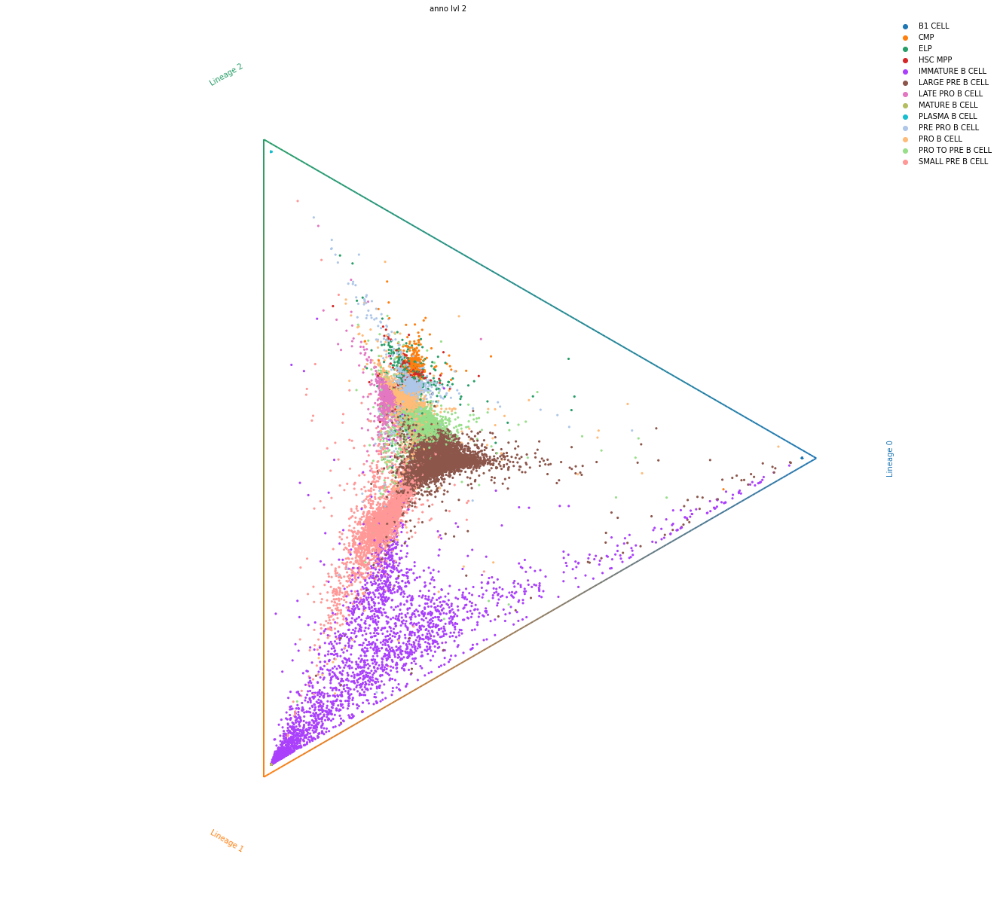

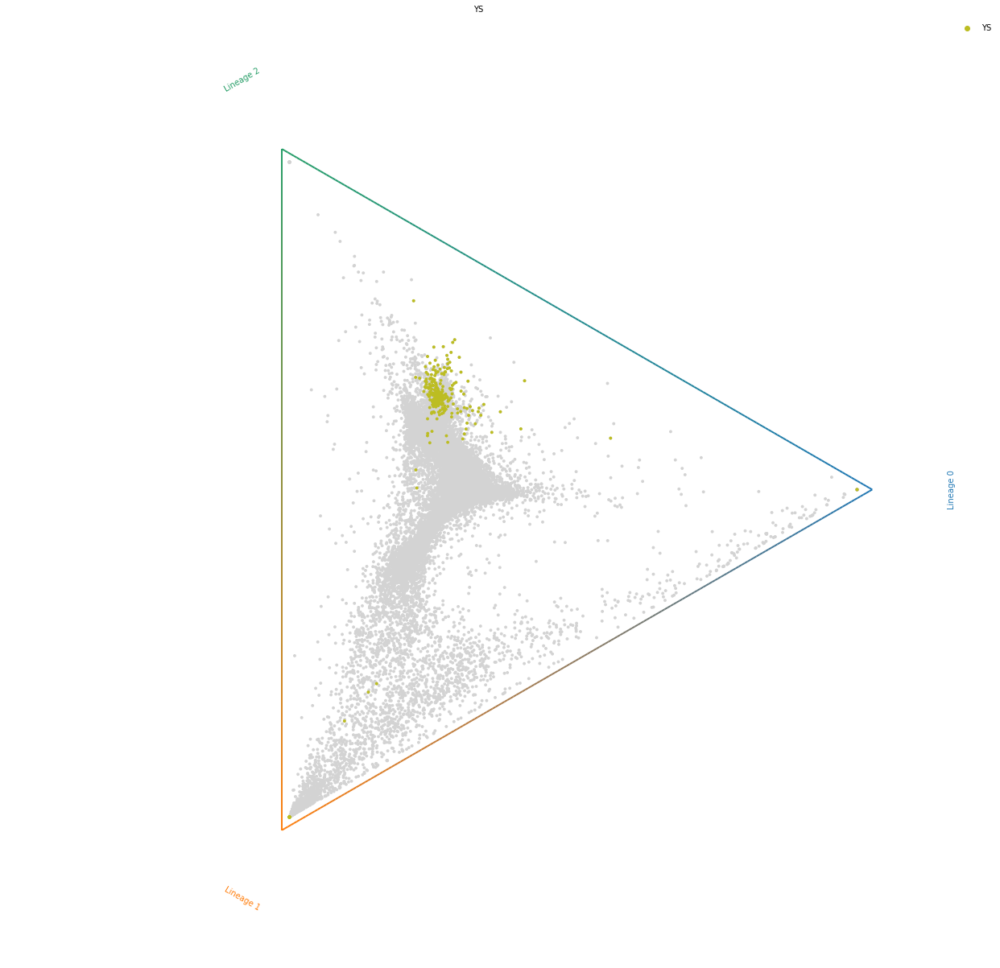

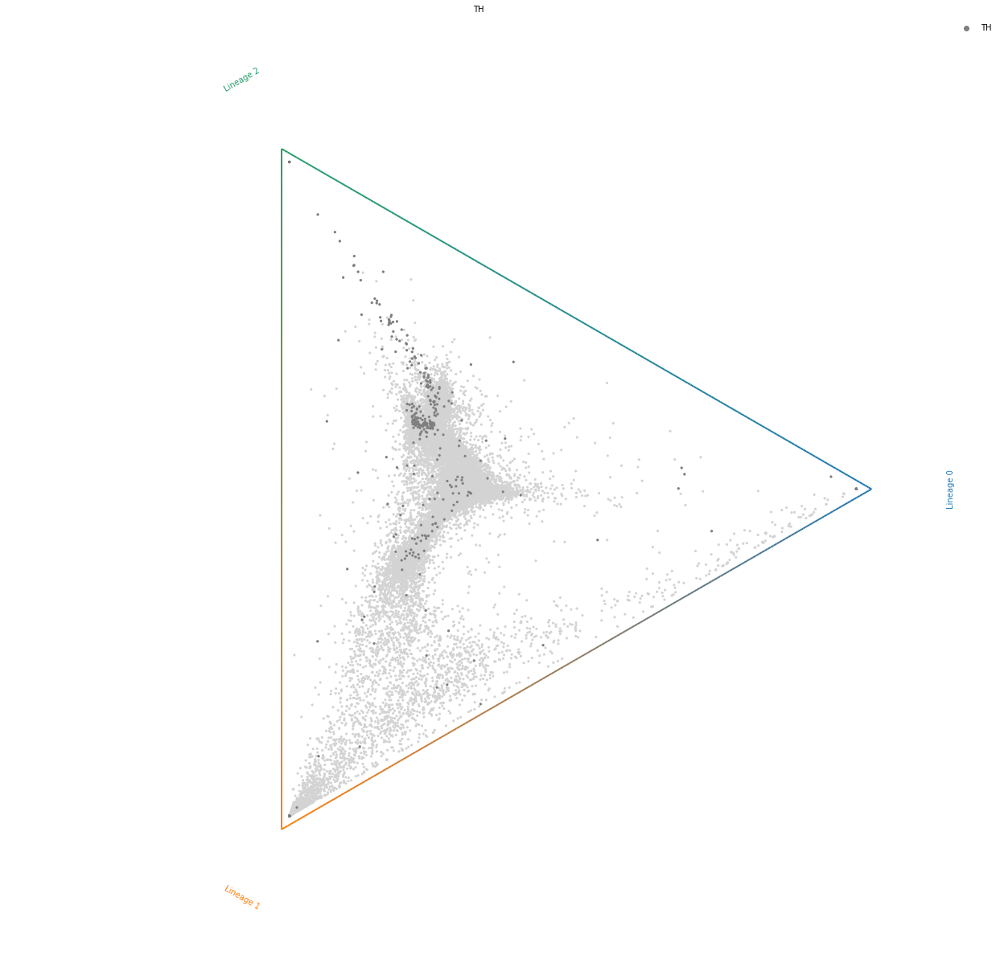

In [63]:
plt.rcParams["figure.figsize"] = [10,10]
cr.pl.circular_projection(adata_b, keys="anno_lvl_2", figsize=[100,100], size=40, legend_loc="upper right")
cr.pl.circular_projection(adata_b, keys="organ", figsize=[100,100], size=60, groups=["YS"], legend_loc="upper right")
cr.pl.circular_projection(adata_b, keys="organ", figsize=[100,100], size=40, groups=["TH"], legend_loc="upper right")

## Compute pseudotime from transition matrix

In [81]:
adata_b.uns["iroot"] = np.where(adata_b.obs.anno_lvl_2=="HSC_MPP")[0][0]

ERROR! Session/line number was not unique in database. History logging moved to new session 150


In [82]:
g.compute_gdpt()

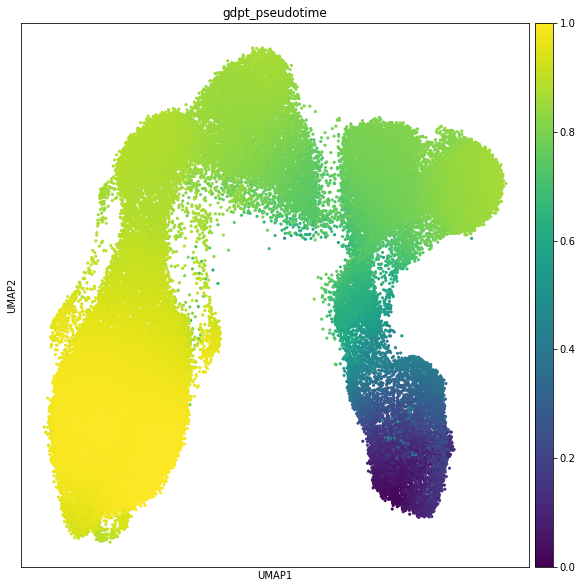

In [88]:
sc.pl.umap(adata_b, color="gdpt_pseudotime", size=40)

Set terminal states based on inferred DPT 

In [102]:
g.set_terminal_states({"MATURE B CELL": adata_b.obs[adata_b.obs["anno_lvl_2"] == "MATURE B CELL"].gdpt_pseudotime.nlargest(20).index, 
                      "B1 CELL": adata_b.obs[adata_b.obs["anno_lvl_2"] == "B1 CELL"].gdpt_pseudotime.nlargest(20).index,
                      "PLASMA B CELL": adata_b.obs[adata_b.obs["anno_lvl_2"] == "PLASMA B CELL"].gdpt_pseudotime.nlargest(20).index})

ERROR! Session/line number was not unique in database. History logging moved to new session 157


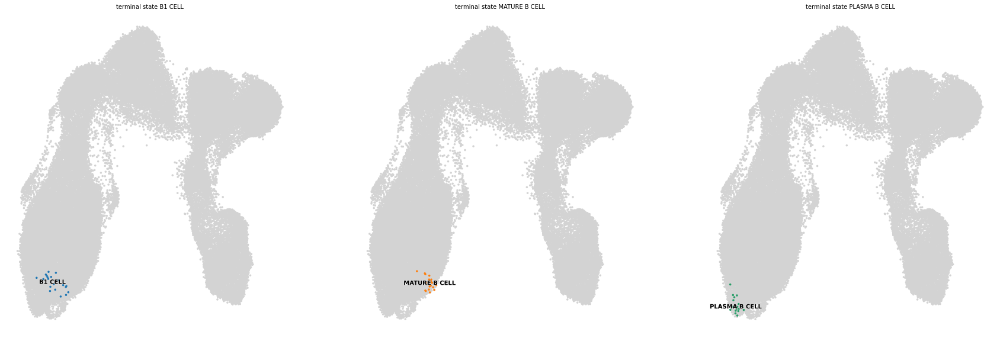

In [106]:
g.plot_terminal_states(same_plot=False, size=50)

In [ ]:
g.compute_absorption_probabilities(use_petsc=True)

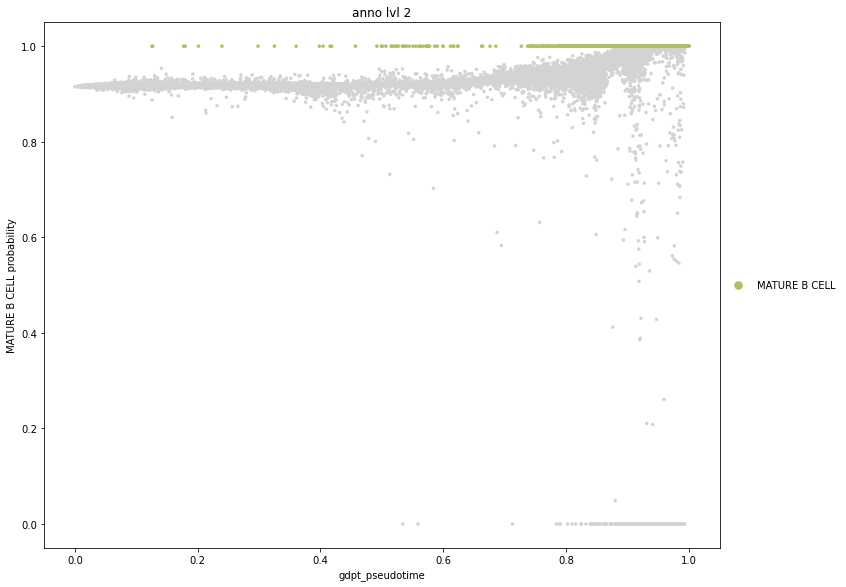

In [92]:
sc.pl.scatter(adata_b, "gdpt_pseudotime", "MATURE B CELL probability", size=50, color="anno_lvl_2", groups=["MATURE B CELL"])

### Biased pseudotime by developmental age

I borrow a function from Palantir, found in `cellrank.tl._utils`. This function takes a symmetric connectivity matrix 

#### Try just using PalantirKernel

In [7]:
adata_b.obs["age"] = adata_b.obs["age"].astype('int64')
age_k = cr.tl.kernels.PalantirKernel(adata_b, time_key="age").compute_transition_matrix()

In [48]:
ck = cr.tl.kernels.ConnectivityKernel(adata_b).compute_transition_matrix()

In [61]:
combo_k = 0.8*ck + 0.2*age_k

In [62]:
g_age = cr.tl.estimators.GPCCA(combo_k)
print(g_age)

GPCCA[n=72035, kernel=((0.8 * <Conn[dnorm=True, key=connectivities]>) + (0.2 * <Pala[k=3, dnorm=True, n_neighs=219]>))]


In [63]:
## Convert to category to use to name macrostates
adata_b.obs["anno_lvl_2"] = adata_b.obs["anno_lvl_2"].astype("category")

## Use the number of annotated clusters as number of macrostates/schur vectors
n_states = adata_b.obs["anno_lvl_2"].unique().shape[0]

In [64]:
g_age.compute_schur(n_components=n_states, method="krylov")
# g.plot_spectrum()

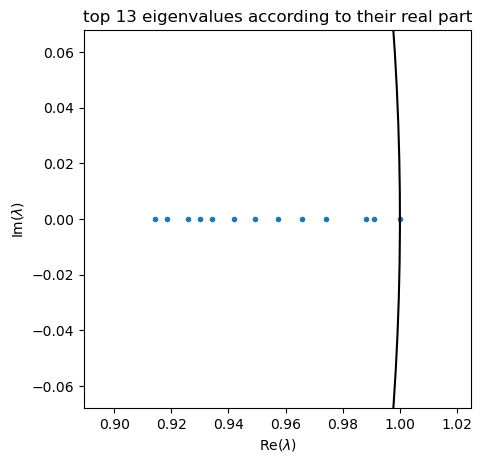

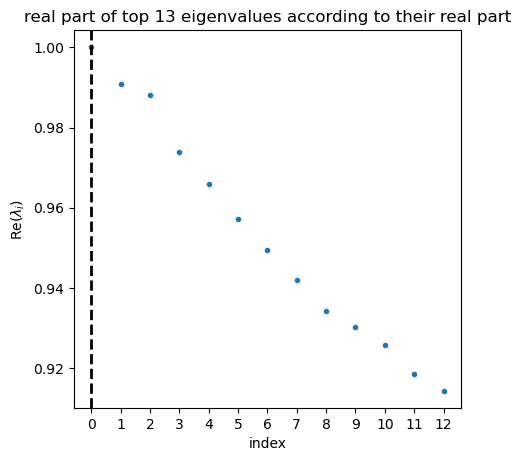

In [65]:
g_age.plot_spectrum()
g_age.plot_spectrum(real_only=True)

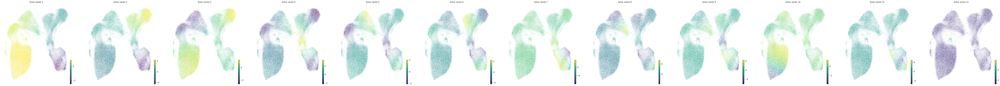

In [66]:
g_age.plot_schur()

In [ ]:
g_age.compute_macrostates(n_states=n_states, cluster_key="anno_lvl_2", n_cells=30)
plt.rcParams["figure.figsize"] = [8,8]
g_age.plot_macrostates()

In [ ]:
g_age.plot_coarse_T(text_kwargs={"fontsize": 10})

#### Set terminal states by pseudotime

In [67]:
adata_b.uns["iroot"] = np.where(adata_b.obs.anno_lvl_2=="HSC_MPP")[0][0]

In [99]:
g_age.compute_gdpt(n_components=n_states)

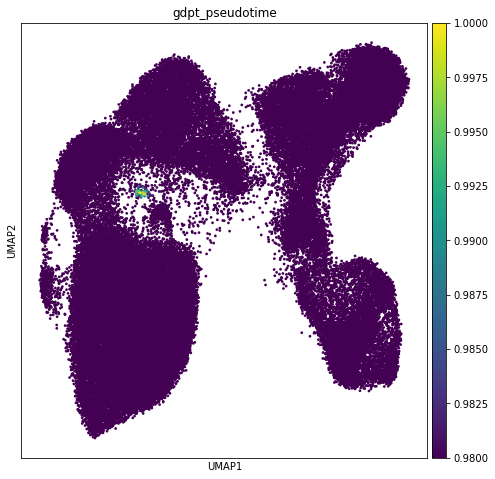

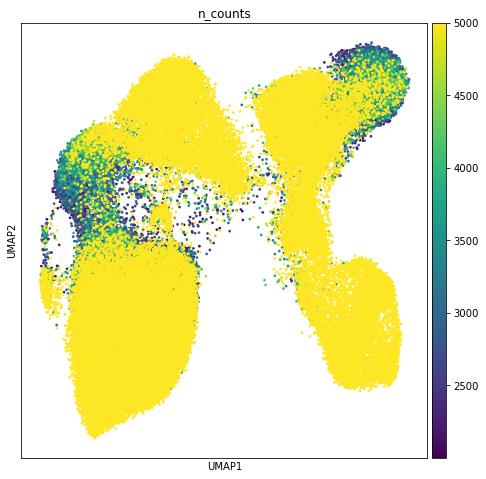

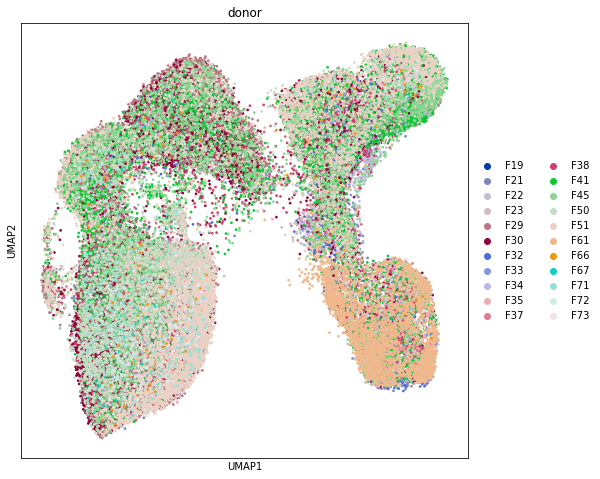

In [136]:
sc.pl.umap(adata_b, color="gdpt_pseudotime", size=30, vmin=0.98)
sc.pl.umap(adata_b, color="n_counts", size=30, vmax=5000)
sc.pl.umap(adata_b, color="donor", size=30)

In [102]:
g_age.set_terminal_states({"MATURE B CELL": adata_b.obs[adata_b.obs["anno_lvl_2"] == "MATURE B CELL"].gdpt_pseudotime.nlargest(20).index, 
                      "B1 CELL": adata_b.obs[adata_b.obs["anno_lvl_2"] == "B1 CELL"].gdpt_pseudotime.nlargest(20).index,
                      "PLASMA B CELL": adata_b.obs[adata_b.obs["anno_lvl_2"] == "PLASMA B CELL"].gdpt_pseudotime.nlargest(20).index})

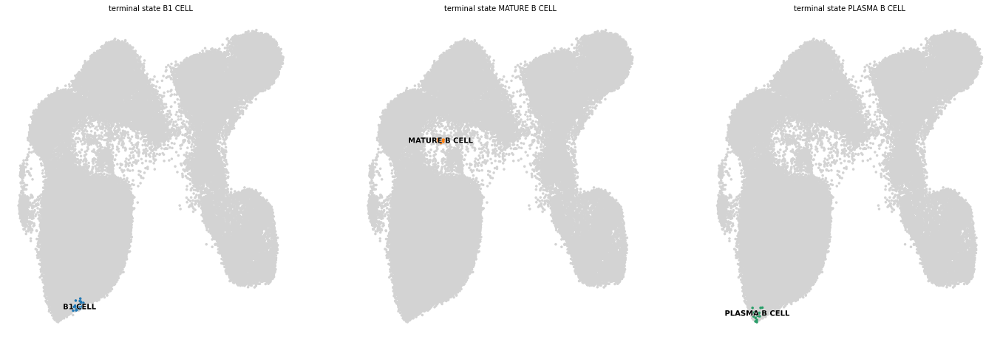

In [103]:
g_age.plot_terminal_states(same_plot=False, size=50)

In [72]:
g_age.compute_absorption_probabilities(use_petsc=True, n_jobs=10)

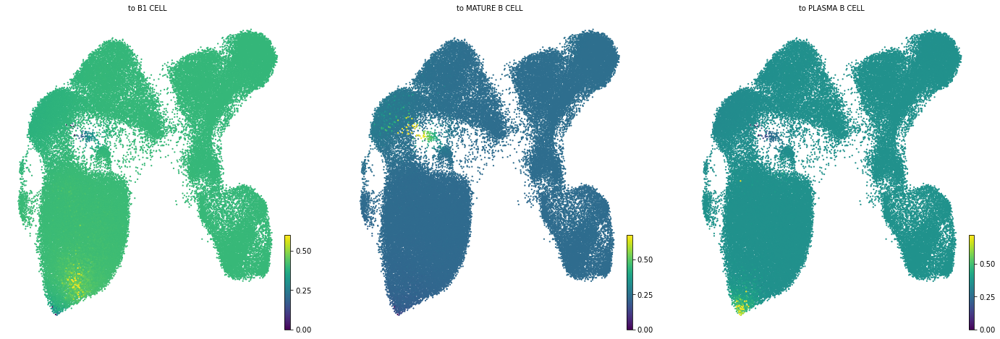

In [73]:
plt.rcParams["figure.figsize"] = [8,8]
g_age.plot_absorption_probabilities(same_plot=False, size=20)

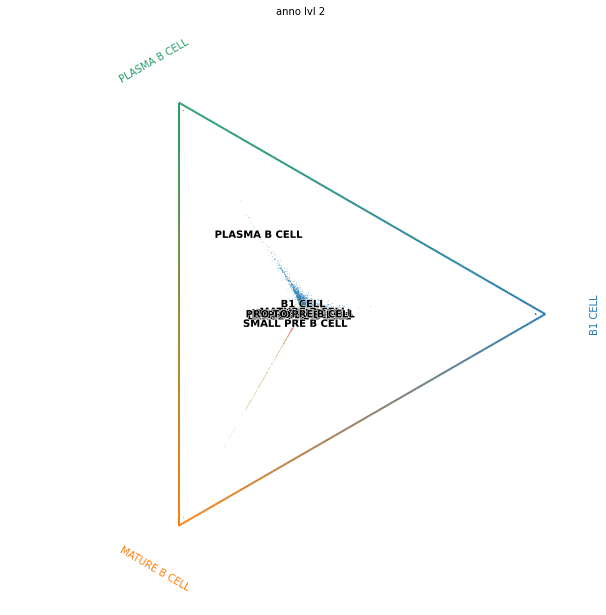

In [60]:
cr.pl.circular_projection(adata_b, keys="anno_lvl_2", figsize=[50,50])

In [32]:
sc.pl.scatter(adata_b, "gpdt_pseudotime", 'terminal_states_probs')

ValueError: `x`, `y`, and potential `color` inputs must all come from either `.obs` or `.var`

### GeoSketching

In [33]:
from geosketch import gs

def get_sketch(adata,key,folds=10,how='pd',min_num_per_key=500,start='filter',raw=True):
    '''geometric sketching based on diffusion map and pca
    folds: folds to subsample
    min_num_per_key: minimun number to sample'''
    sketch_index = []
    for smp in set(adata.obs[key]):
        print(smp)
        c = adata.obs[key] == smp
        print('from:',sum(c))
        
        if start=='filter':
            sdata = get_subset(adata,c,raw=raw)
        else:        
            sdata = adata[c]
#             sc.pp.filter_genes_dispersion(sdata)
            sc.pp.pca(sdata)
        
        if 'd' in how:
            sc.pp.neighbors(sdata)
            sc.tl.diffmap(sdata)

        N = np.max([np.int(np.sum(c)/folds),np.min([min_num_per_key,np.sum(c)])])
        print('to select:',N)
        if how =='pd':
            set1 = set(sdata.obs_names[gs(sdata.obsm['X_diffmap'],N,replace=False)])
            set2 = set(sdata.obs_names[gs(sdata.obsm['X_pca'][:,:50],N,replace=False)])
            sketch_index.extend(list(set1.union(set2)))
        elif how =='p':
            set2 = set(sdata.obs_names[gs(sdata.obsm['X_pca'][:,:50],N,replace=False)])
            sketch_index.extend(list(set2))
        elif how =='d':
            set1 = set(sdata.obs_names[gs(sdata.obsm['X_diffmap'][:,:20],N,replace=False)])
            sketch_index.extend(list(set1))
        else:
            raise SystemError
        print('length of sketch:',len(sketch_index))
    return(sketch_index)

In [ ]:
geosketch_ix = get_sketch(adata, "bbk", how="p", start=None)

In [47]:
sdata = adata[geosketch_ix]

In [52]:
# panfetal_utils.pfi_clustering(sdata, how="bu")

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


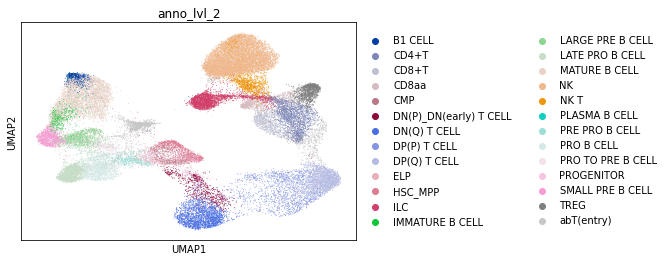

In [48]:
sc.pl.umap(sdata, color="anno_lvl_2")

In [168]:
def _bias_knn(
    conn, pseudotime, n_neighbors, k= 3
):
    """
    Palantir Kernel utility function.
    This function takes in symmetric connectivities and a pseudotime and removes edges that point "against" pseudotime,
    in this way creating a directed graph. For each node, it always keeps the closest neighbors, making sure the graph
    remains connected.
    Parameters
    ----------
    conn
        The nearest neighbor connectivities.
    pseudotime
        Pseudotemporal ordering of cells.
    n_neighbors
        Number of neighbors to keep
    k
        Number, alongside with ``n_neighbors`` which determined the threshold for candidate indices.
    Returns
    -------
    :class:`scipy.sparse.csr_matrix`.
        Biased connectivities according to the ``pseudotime``.
    """

    # set a threshold for the neighbors to keep
    k_thresh = np.min([int(np.floor(n_neighbors / k)) - 1, 30])
    conn_biased = conn.copy()

    # loop over rows in the adjacency matrix
    for i in range(conn.shape[0]):

        # get indices, values and current pseudo t
        row_data = conn[i, :].data
        row_ixs = conn[i, :].indices
        current_t = pseudotime[i]

        # get the 'candidates' - ixs of nodes not in the k_thresh closest neighbors
        p = np.flip(np.argsort(row_data))
        sorted_ixs = row_ixs[p]
        cand_ixs = sorted_ixs[k_thresh:]

        # compare pseudotimes and set indices to zero
        cand_t = pseudotime[cand_ixs]
        rem_ixs = cand_ixs[cand_t < current_t]
        conn_biased[i, rem_ixs] = 0

    conn_biased.eliminate_zeros()

    return conn_biased

In [169]:
def age_biased_knn(adata, k=3):
    '''
    Transform connectivity matrix removing edges that point "against" age,
    in this way creating a directed graph. Builds upon ``cellrank.tl._utils._bias_knn``.
    - adata: anndata object storing connectivity matrix in ``obsp``
    - k: Number, alongside with ``n_neighbors`` which determined the threshold for candidate indices.
        (default=3 as in ``PalantirKernel``)
    '''
    import cellrank.tl._utils
    conn = adata.obsp['connectivities']
    pseudotime = adata_b.obs["age"].astype("int64")
    n_neighbors = adata_b.uns['neighbors']["params"]["n_neighbors"]
    
    conn_biased = _bias_knn(conn, pseudotime, n_neighbors, k)
    adata.obsp['connectivities_biased'] = conn_biased

In [38]:
## Recalculate BBKNN graph without trimming (maintains symmetry)
from bbknn import bbknn
adata_b.obs['bbk'] = [x+y+z for x,y,z in zip(adata_b.obs['donor'],adata_b.obs['method'],adata_b.obs['organ'])]
bbknn(adata_b, batch_key = 'bbk', n_pcs=30, approx=True, trim=0)


In [170]:
age_biased_knn(adata_b)

In [204]:

## Heavy copy pasting from cellrank
## Density normalize
q = np.asarray(conn.sum(axis=0))
Q = scipy.sparse.spdiags(1.0 / q, 0, other.shape[0], other.shape[0])

Q @ other @ Q

NameError: name 'other' is not defined

In [219]:
cr.tl.kernels.Kernel(adata_b)

TypeError: Can't instantiate abstract class Kernel with abstract methods compute_transition_matrix, copy

In [201]:
conn = adata_b.obsp['connectivities_biased']

In [173]:
cr.tl.kernels.PrecomputedKernel(adata_b.obsp['connectivities_biased'])

ValueError: Not a valid transition matrix, not all rows sum to 1